In [ ]:
!git clone https://github.com/ria-com/nomeroff-net.git

fatal: destination path 'nomeroff-net' already exists and is not an empty directory.


In [ ]:
%cd nomeroff-net

/content/nomeroff-net


In [ ]:
!pip3 install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/lilohuang/PyTurboJPEG.git to /tmp/pip-install-ih66wjfb/pyturbojpeg_8aa29b0b94af4033be16a3219f39dbf3
  Running command git clone -q https://github.com/lilohuang/PyTurboJPEG.git /tmp/pip-install-ih66wjfb/pyturbojpeg_8aa29b0b94af4033be16a3219f39dbf3
  Cloning https://github.com/ria-com/modelhub-client.git to /tmp/pip-install-ih66wjfb/modelhub-client_ebc043e6e292421393abdde114d981f6
  Running command git clone -q https://github.com/ria-com/modelhub-client.git /tmp/pip-install-ih66wjfb/modelhub-client_ebc043e6e292421393abdde114d981f6


In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from torch import no_grad
from typing import Any, Dict, Optional, Union
from nomeroff_net.image_loaders import BaseImageLoader
from nomeroff_net.pipelines.base import Pipeline
from nomeroff_net.tools import unzip
from nomeroff_net.pipes.number_plate_localizators.yolo_v5_detector import Detector

In [30]:
from nomeroff_net.tools.mcm import (modelhub, get_mode_torch)
from nomeroff_net.tools.image_processing import (distance,
                                                 get_cv_zone_rgb,
                                                 crop_image,
                                                 minimum_bounding_rectangle,
                                                 reshape_points,
                                                 normalize_img)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#_model = '/nomeroff_net/pipes/number_plate_localizators/yolo_v5_detector.py'
path_to_data = '/content/drive/MyDrive/Colab Notebooks/Car_plates/data'

In [ ]:
detector = Detector()
detector.load()

YOLOv5 🚀 v6.2-183-gc98128f Python-3.7.14 torch-1.12.1+cu113 CPU

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients
Adding AutoShape... 


In [37]:
def direction(source):
    cap = cv2.VideoCapture(f'{path_to_data}/{source}.mp4')
    
    frame_width = int( cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int( cap.get( cv2.CAP_PROP_FRAME_HEIGHT))

    ret, frame1 = cap.read()
    ret, frame2 = cap.read()

    list_x=[]
    s=0

    while cap.isOpened() and frame2 is not None:
        diff = cv2.absdiff(frame1, frame2)
        gray = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)
        blur = cv2.GaussianBlur(gray, (5,5), 0)
        _, thresh = cv2.threshold(blur, 25, 255, cv2.THRESH_BINARY)
        dilated = cv2.dilate(thresh, None, iterations=3)
        contours, _ = cv2.findContours(dilated, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

        areas = [cv2.contourArea(c) for c in contours]        
        if len(areas) != 0:
            max_index = np.argmax(areas)
            cnt=contours[max_index]  
        
        (x, y, w, h) = cv2.boundingRect(cnt)
        list_x.append(x)

        model_outputs = detector.predict(frame1)
        try:
            len(model_outputs[0][0])
            xp1, yp1, xp2, yp2, p, cl = model_outputs[0][0]
            if abs(xp2-xp1)*abs(yp2-yp1)>s and abs(xp2-xp1)/abs(yp2-yp1)>3:
                img_res = frame1
                s = abs(xp2-xp1)*abs(yp2-yp1)
        except:
            pass
            
        frame1 = frame2
        ret, frame2 = cap.read()
        if cv2.waitKey(40) == 27:
            break

    model_outputs = detector.predict(img_res)
    model_outputs_int = [int(i) for i in model_outputs[0][0]]
    x1_res, y1_res, x2_res, y2_res, p, cl = model_outputs_int
    img_res_bbox = img_res.copy()
    cv2.rectangle(img_res_bbox, 
                  (x1_res, y1_res), 
                  (x2_res, y2_res), 
                  (0, 255, 255), 
                  thickness = 1, 
                  lineType=cv2.LINE_AA)
    cv2_imshow(img_res_bbox)

    list_dir = []
    list_dir = [list_x[i+1] - list_x[i] for i in range(0, len(list_x)-1)]
    list_dir = list(filter(lambda x: x != 0 and abs(x) < 25, list_dir))

    if sum(list_dir) > 0:
        print(f'{source}: машина выехала')
    else:
        print(f'{source}: машина заехала')        

    image_part, (x, w, y, h) = crop_image(img_res, model_outputs_int[0:4])
    img_norm = cv2.resize(image_part, (295, 64))
    img_norm_2 = cv2.normalize(img_norm, None, alpha=15, beta=240,
                           norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    cv2_imshow(img_norm_2)

    cv2.destroyAllWindows()
    cap.release()

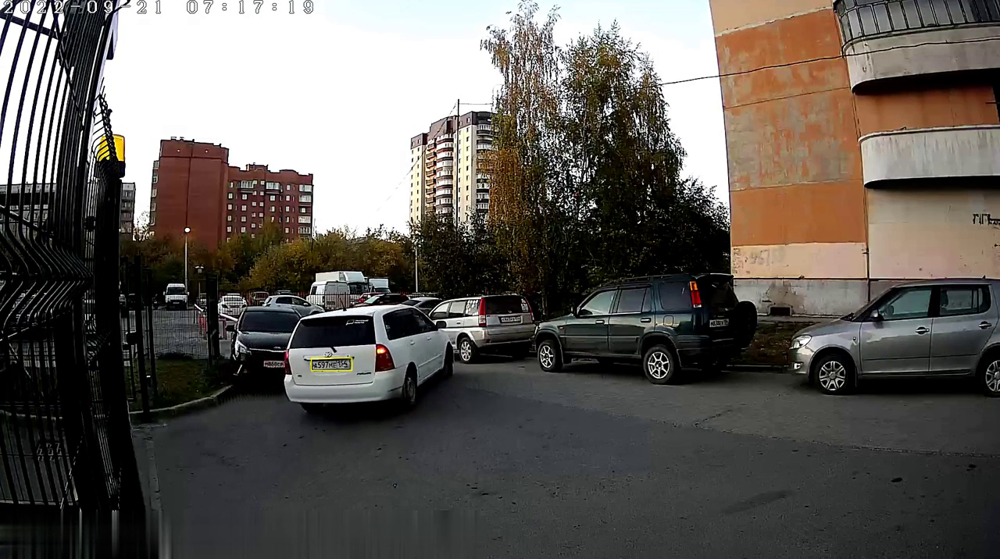

video_01: машина выехала


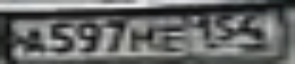

In [38]:
direction('video_01')

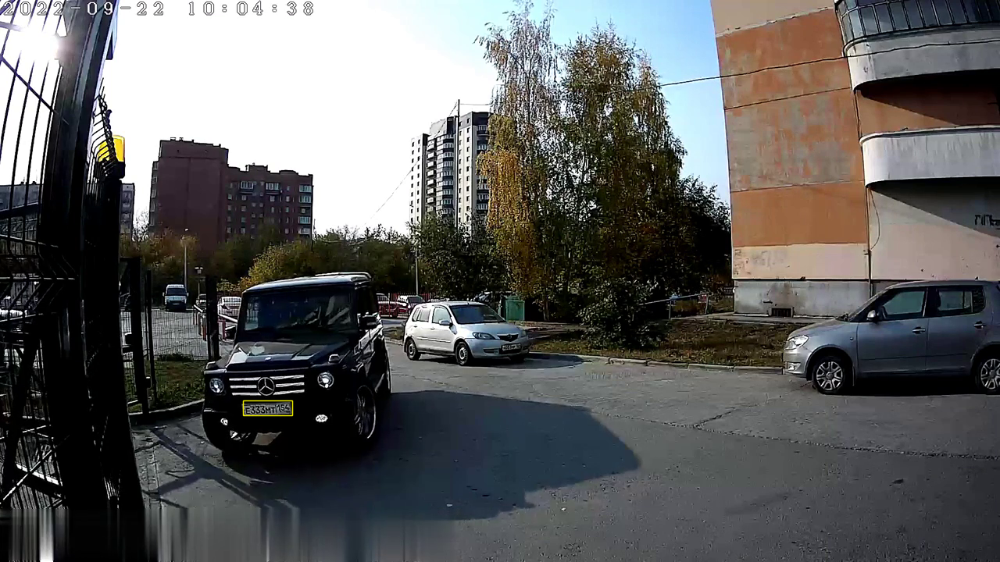

video_02: машина заехала


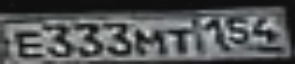

In [39]:
direction('video_02')

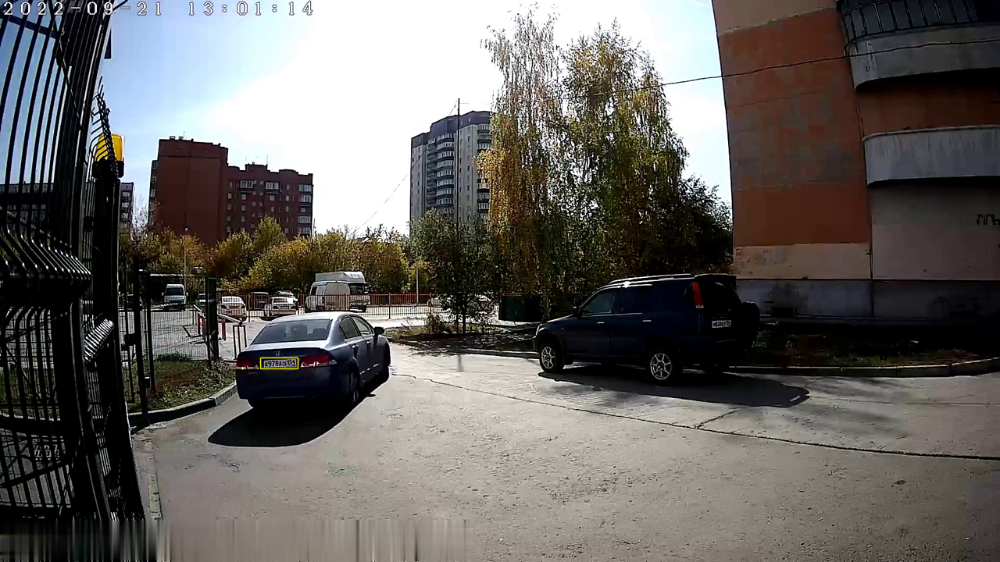

video_03: машина выехала


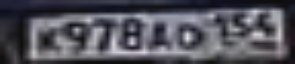

In [40]:
direction('video_03')

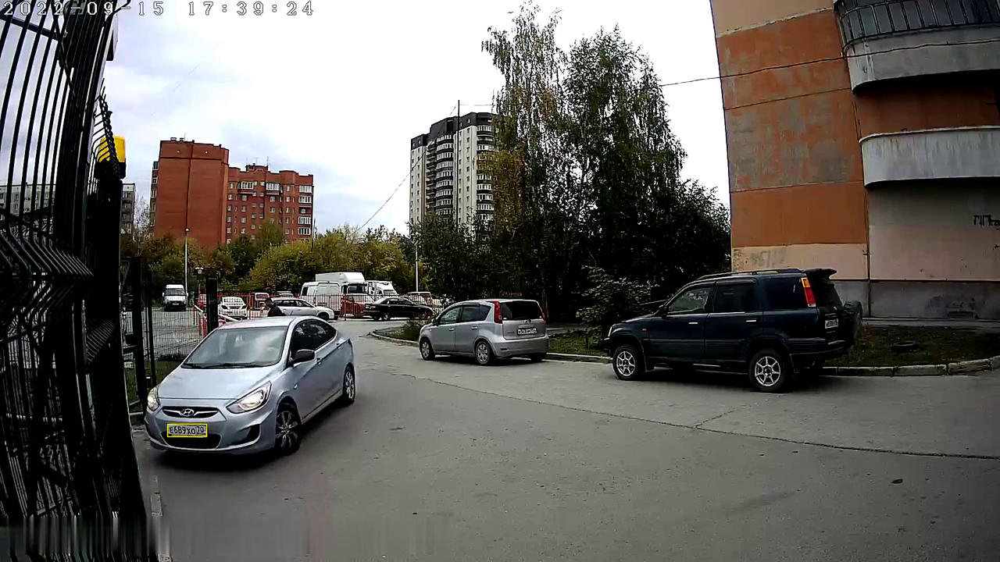

video_04: машина заехала


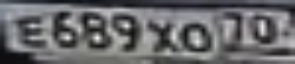

In [41]:
direction('video_04')

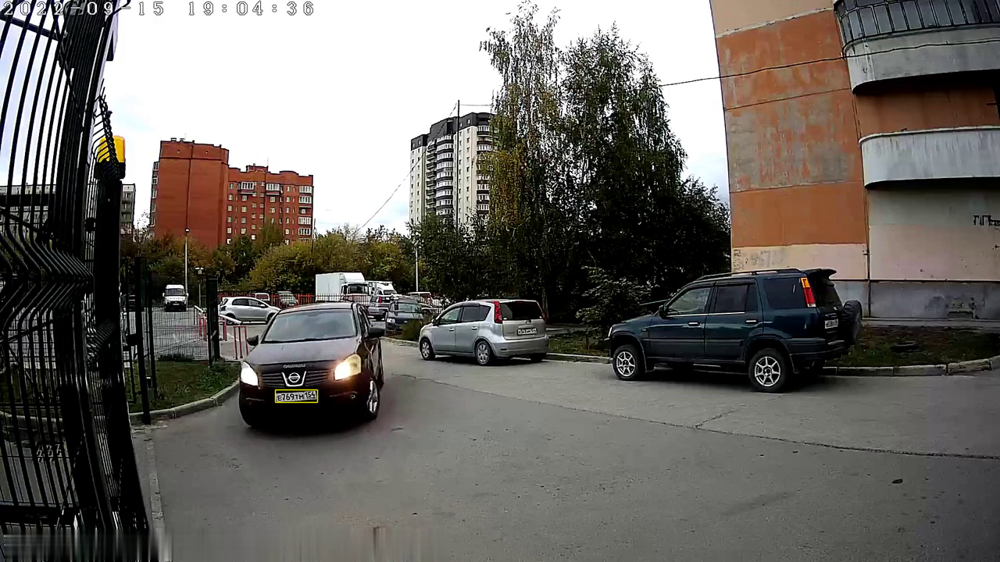

video_05: машина заехала


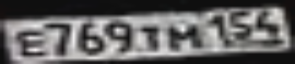

In [42]:
direction('video_05')

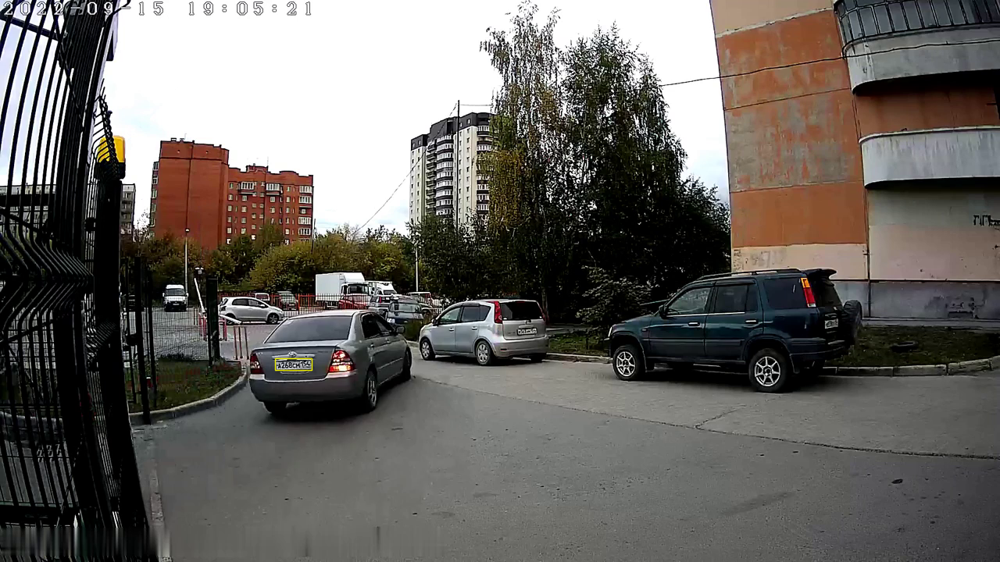

video_06: машина выехала


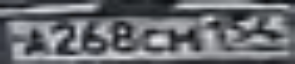

In [43]:
direction('video_06')

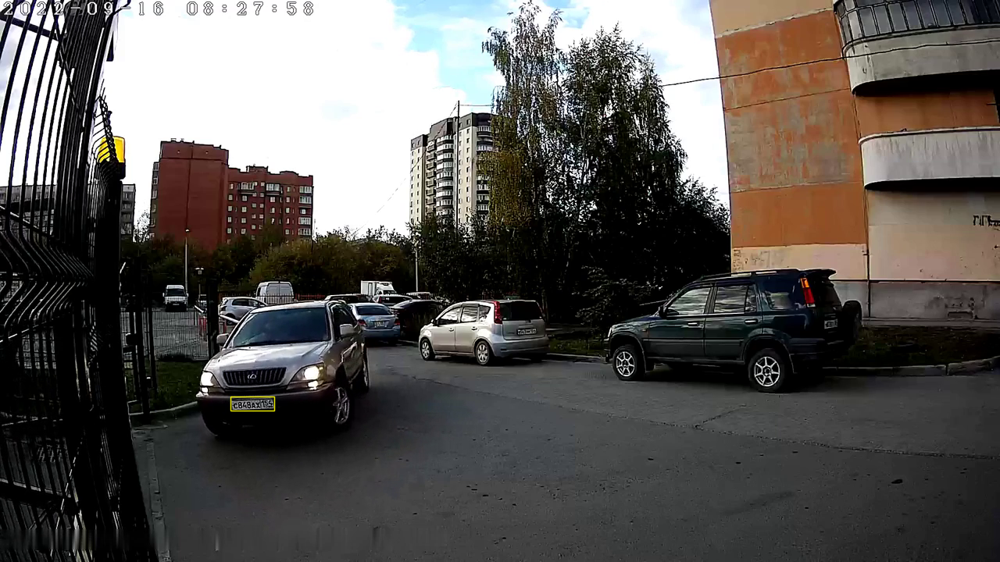

video_07: машина заехала


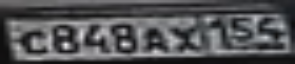

In [44]:
direction('video_07')

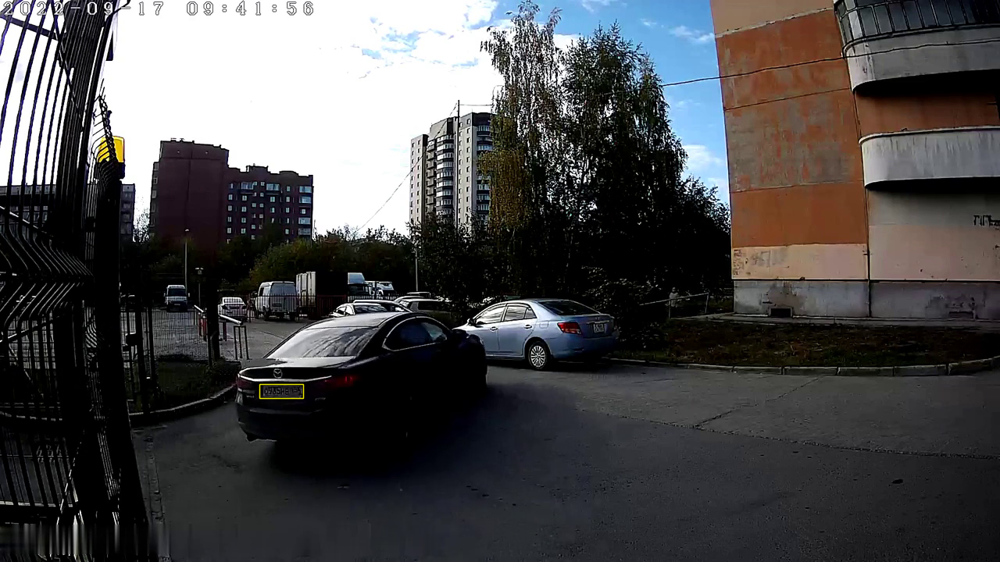

video_08: машина выехала


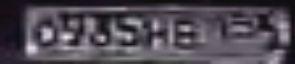

In [45]:
direction('video_08')